## Section 01: Exploratory Data Analysis

1. Are there any null values or outliers? How will you wrangle/handle them?<br>

2. Are there any variables that warrant transformations?<br>
3. Are there any useful variables that you can engineer with the given data?<br>
4. Do you notice any patterns or anomalies in the data? Can you plot them?<br>

### Read & Merge the data

In [4]:
%matplotlib inline

In [5]:
# import the packeage
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
import glob  # use to batch import data

In [6]:
# Read all data set
file_list = glob.glob(r"C:\Users\HP\Desktop\BestTop项目\PTA项目\Airbnb Analysis\listings_summary_*.csv")

In [7]:
dfs = []
for file in file_list:
    parts = file.split("_")  # split the file name
    year = parts[2]          # get the year
    month = parts[3].split(".")[0]  # get the month
    df = pd.read_csv(file)
    df["year"] = year        # add year column
    df["month"] = month      # add month column
    dfs.append(df)

# merge all data sets
df = pd.concat(dfs, ignore_index=True)

# transform the data type of new column
df["year"] = df["year"].astype(int)
df["month"] = df["month"].astype(int)

# order the data by year and month created
df = df.sort_values(["year", "month"]).reset_index(drop=True)

In [8]:
df.head() # check the merge outcome and have a glance of data

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,year,month,number_of_reviews_ltm,license
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149.0,1,9,2018-10-19,0.21,6,365,2019,1,NaN,NaN
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225.0,1,45,2019-05-21,0.38,2,355,2019,1,NaN,NaN
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150.0,3,0,NaN,NaN,1,365,2019,1,NaN,NaN
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89.0,1,270,2019-07-05,4.64,1,194,2019,1,NaN,NaN
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80.0,10,9,2018-11-19,0.10,1,0,2019,1,NaN,NaN


In [9]:
df = df.drop(columns = ['name','host_name','number_of_reviews_ltm','license']) # delete extra meaningless columns

In [10]:
df.info() # check data types

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 429541 entries, 0 to 429540
Data columns (total 16 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              429541 non-null  int64  
 1   host_id                         429541 non-null  int64  
 2   neighbourhood_group             429541 non-null  object 
 3   neighbourhood                   429541 non-null  object 
 4   latitude                        429541 non-null  float64
 5   longitude                       429541 non-null  float64
 6   room_type                       429541 non-null  object 
 7   price                           282608 non-null  float64
 8   minimum_nights                  429541 non-null  int64  
 9   number_of_reviews               429541 non-null  int64  
 10  last_review                     303200 non-null  object 
 11  reviews_per_month               303200 non-null  float64
 12  calculated_host_

### Understand the data using YData report

In [12]:
# Check the data set info by YData Profiling
profile = ProfileReport(df, title="Pandas Profiling Report")

In [13]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Clean the data (null value & outliers & feature engineering)

#### Missing value

##### (1) Price

In [17]:
# split the missing part of price data
missing_df = df[df["price"].isna()]

# check if the price is null corresponding to 0 value of availability
missing_df["availability_365"].value_counts(normalize=True)

availability_365
0      0.853702
365    0.015742
364    0.005996
1      0.005792
269    0.003614
         ...   
189    0.000034
240    0.000027
116    0.000027
203    0.000027
201    0.000027
Name: proportion, Length: 366, dtype: float64

85%+ of missing value price corresponds to zero value of availability. So we can think that the null part of price represents the invalid house source on Airbnb, then we can delete all the observations that include null price.

In [19]:
df = df.dropna(subset=["price"])

##### (2) last_review and reviews_per_month

We find that null values of two columns are located at the same rows. We check that if it is due to the zero number of total reviews.

In [22]:
# split the missing part of review data
missing_df = df[df["last_review"].isna()]

# check if the last review is null corresponding to 0 value of review numbers
missing_df["number_of_reviews"].value_counts(normalize=True)

number_of_reviews
0    1.0
Name: proportion, dtype: float64

Therefore, we fill the reviews_per_month with 0 number, and extract the time info of last_review then delete original column.

In [24]:
df.loc[:,'reviews_per_month'] = df['reviews_per_month'].fillna(0)

In [25]:
df["last_review"] = pd.to_datetime(df["last_review"])

C:\Users\HP\AppData\Local\Temp\ipykernel_2080\3465608367.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["last_review"] = pd.to_datetime(df["last_review"])


In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 282608 entries, 0 to 429540
Data columns (total 16 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   id                              282608 non-null  int64         
 1   host_id                         282608 non-null  int64         
 2   neighbourhood_group             282608 non-null  object        
 3   neighbourhood                   282608 non-null  object        
 4   latitude                        282608 non-null  float64       
 5   longitude                       282608 non-null  float64       
 6   room_type                       282608 non-null  object        
 7   price                           282608 non-null  float64       
 8   minimum_nights                  282608 non-null  int64         
 9   number_of_reviews               282608 non-null  int64         
 10  last_review                     204318 non-null  datetime64[n

In [27]:
df["last_review_days_since"] = (pd.to_datetime("today") - df["last_review"]).dt.days #create new column means the days since last review

C:\Users\HP\AppData\Local\Temp\ipykernel_2080\2144695098.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["last_review_days_since"] = (pd.to_datetime("today") - df["last_review"]).dt.days #create new column means the days since last review


In [28]:
df = df.drop(columns=['last_review'])
df['last_review_days_since'] = df['last_review_days_since'].fillna(9999) # Use a large number to represent no review
df.isnull().sum()

id                                0
host_id                           0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
year                              0
month                             0
last_review_days_since            0
dtype: int64

#### Outliers

We use 2.5 IQR to filter the data.

##### Price : remove outlier + take log

In [32]:
# remove outlier (IQR, Q1 and Q3 get from ydata report)
IQR = 147
Q1=80
Q3=227
lower_bound = Q1 - 2.5 * IQR
upper_bound = Q3 + 2.5 * IQR
df = df[(df["price"] >= lower_bound) & (df["price"] <= upper_bound)]

In [33]:
df["log_price"] = np.log1p(df["price"])  # log1p(x) = log(x + 1)，to avoid log(0) issue
df.drop(columns=['price'], inplace=True)

##### minimum_nights : remove upper outlier

We only remove extreme large min nights value because usually 1-30 min nights on Airbnb.

In [36]:
Q1 = 30
Q3 = 30
IQR = 0

upper_bound = Q3 + 2.5 * IQR
df = df[df["minimum_nights"] <= upper_bound]

##### number_of_reviews: create is_reivewed value to deal with zero issues

In [38]:
df["is_reviewed"] = (df["number_of_reviews"] > 0).astype(int)

##### calculated_host_listings_count: take log + create is_super_host value to indicate hosts that own more than 10 houses whose pricing strategy might be different from small hosts.

In [40]:
df["is_super_host"] = (df["calculated_host_listings_count"] > 10).astype(int)

In [41]:
# Check the distribution of availability group with house price, 
# if the extreme low availability (<30 per year) having abnormal price pattern, 
# we consider drop availability<30
df["availability_group"] = pd.cut(df["availability_365"], bins=[0, 30, 180, 365], labels=["0-30", "30-180", "180-365"])
sns.boxplot(x="availability_group", y="log_price", data=df)
df.drop(columns=['availability_group'], inplace=True)

We find that for different availability group, the distribution of house price is similar, so we decide not to delete zero number of availability.

In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 254338 entries, 0 to 429540
Data columns (total 18 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              254338 non-null  int64  
 1   host_id                         254338 non-null  int64  
 2   neighbourhood_group             254338 non-null  object 
 3   neighbourhood                   254338 non-null  object 
 4   latitude                        254338 non-null  float64
 5   longitude                       254338 non-null  float64
 6   room_type                       254338 non-null  object 
 7   minimum_nights                  254338 non-null  int64  
 8   number_of_reviews               254338 non-null  int64  
 9   reviews_per_month               254338 non-null  float64
 10  calculated_host_listings_count  254338 non-null  int64  
 11  availability_365                254338 non-null  int64  
 12  year                 

## Section 02: 2024 Nov Data Analysis

In [45]:
# Get the 2024 Nov data for analysis
df_24Nov = df[(df["year"] == 2024) & (df["month"] == 11)]

#### Which room type is most popular in Airbnb this month?

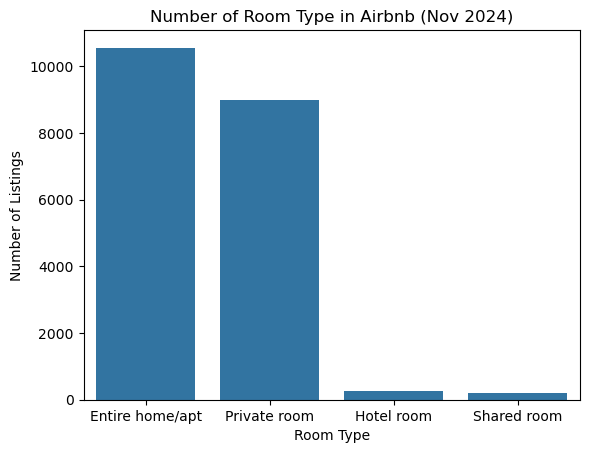

In [134]:
# calculate number of each room type
room_counts = df_24Nov["room_type"].value_counts()

# barplot
sns.barplot(x=room_counts.index, y=room_counts.values)
plt.xlabel("Room Type")
plt.ylabel("Number of Listings")
plt.title("Number of Room Type in Airbnb (Nov 2024)")
plt.show()

Entire home/apt is most popular in Airbnb this month.

#### Which room type is most expensive in Airbnb this month?

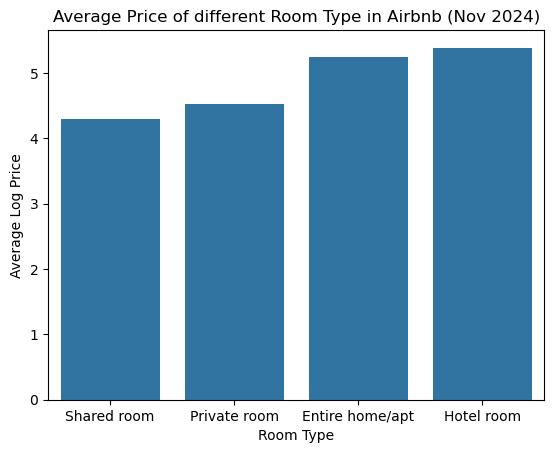

In [50]:
# calculate average room type price
avg_price_by_room = df_24Nov.groupby("room_type")["log_price"].mean().sort_values()

# barplot
sns.barplot(x=avg_price_by_room.index, y=avg_price_by_room.values)
plt.xlabel("Room Type")
plt.ylabel("Average Log Price")
plt.title("Average Price of different Room Type in Airbnb (Nov 2024)")
plt.show()

Hotel room type has the highest average log price in this month, so we think it is most expensive.

#### Which neibourhood and neibourhood_group has most airbnb rooms?

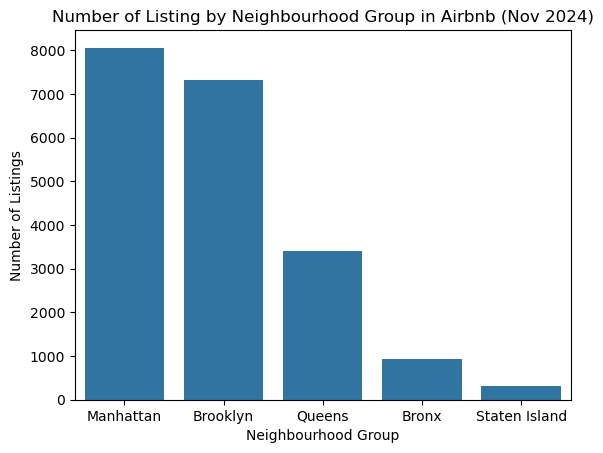

In [53]:
# calculate number of each neighbourhood group
group_counts = df_24Nov["neighbourhood_group"].value_counts()

# barplot
sns.barplot(x=group_counts.index, y=group_counts.values)
plt.xlabel("Neighbourhood Group")
plt.ylabel("Number of Listings")
plt.title("Number of Listing by Neighbourhood Group in Airbnb (Nov 2024)")
plt.show()

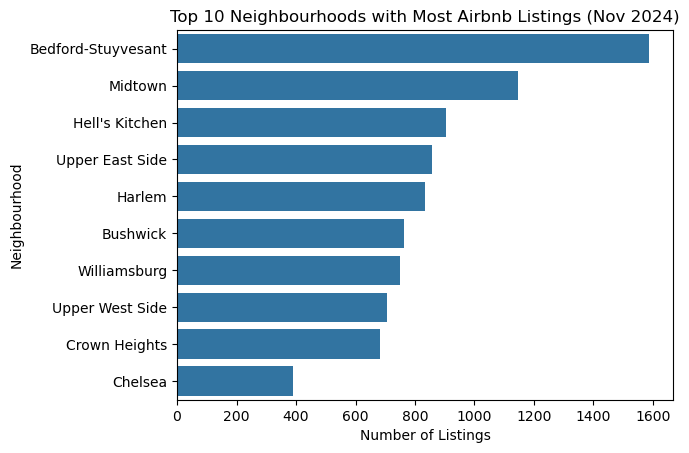

In [54]:
# calculate number of each neighbourhood
neighbourhood_counts = df_24Nov["neighbourhood"].value_counts().nlargest(10)  #only show first 10 neighbourhood

sns.barplot(y=neighbourhood_counts.index, x=neighbourhood_counts.values)
plt.xlabel("Number of Listings")
plt.ylabel("Neighbourhood")
plt.title("Top 10 Neighbourhoods with Most Airbnb Listings (Nov 2024)")
plt.show()

We know that Manhattan neighbourhood group and Bedford-Stuyvesant neighbourhood has most airbnb rooms.

#### For different room type, are they distributed evenly in different neibourhood? Can you create a visualization for this?

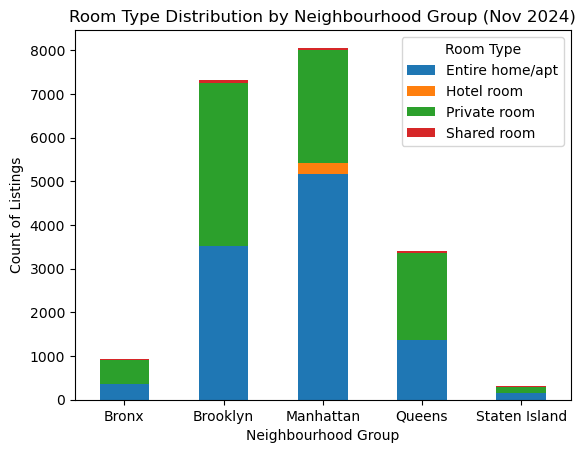

In [57]:
# Calculate room type distribution by neighbourhood group
room_neigh_dist = df_24Nov.groupby(["neighbourhood_group", "room_type"]).size().unstack()

# stacked barplot
room_neigh_dist.plot(kind="bar", stacked=True)
plt.xlabel("Neighbourhood Group")
plt.ylabel("Count of Listings")
plt.title("Room Type Distribution by Neighbourhood Group (Nov 2024)")
plt.legend(title="Room Type")
plt.xticks(rotation=0)
plt.show()

In [58]:
from scipy.stats import chi2_contingency # chi-squared test

chi2, p, dof, expected = chi2_contingency(room_neigh_dist.fillna(0))
print(f"Chi-Square Test: χ²={chi2:.2f}, p-value={p:.4f}")

if p < 0.05:
    print("Room Type Distribution by Neighbourhood Group has significant difference.")
else:
    print("Room Type Distribution by Neighbourhood Group has insignificant difference.")

Chi-Square Test: χ²=1270.69, p-value=0.0000
Room Type Distribution by Neighbourhood Group has significant difference.


From chi-sqaured test and visualization, we know that room type in different neighbourhood group is not evenly distributed.

#### Can you create a prediction on room price based on other informations?

We use randomforest regression model to predict the room price, since it performs better if there is non-linear relationship between factors and room price, and it has lower requirement of data distribution.

##### data processing

In [63]:
pd.set_option('display.max_columns', None) # to view the df_reg entirely
pd.set_option('display.max_rows', None)

df_reg = df.drop(columns=['id','host_id']) # delete columns that meaningless in prediction

# One Hot Encoding
df_reg = pd.get_dummies(df_reg,dtype=int)
df_reg.head().transpose()

,0,1,2,3,4
latitude,40.647490,40.753620,40.80902,40.68514,40.798510
longitude,-73.972370,-73.983770,-73.94190,-73.95976,-73.943990
minimum_nights,1.000000,1.000000,3.00000,1.00000,10.000000
number_of_reviews,9.000000,45.000000,0.00000,270.00000,9.000000
reviews_per_month,0.210000,0.380000,0.00000,4.64000,0.100000
calculated_host_listings_count,6.000000,2.000000,1.00000,1.00000,1.000000
availability_365,365.000000,355.000000,365.00000,194.00000,0.000000
year,2019.000000,2019.000000,2019.00000,2019.00000,2019.000000
month,1.000000,1.000000,1.00000,1.00000,1.000000
last_review_days_since,2325.000000,2111.000000,9999.00000,2066.00000,2294.000000


In [64]:
df_reg_24Nov = df_reg[(df_reg["year"] == 2024) & (df_reg["month"] == 11)]

In [65]:
from sklearn.model_selection import train_test_split

X = df_reg_24Nov.drop(columns=['log_price'])  # predictior
y = df_reg_24Nov['log_price']  # target value

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [66]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [67]:
from sklearn.metrics import mean_squared_error, r2_score

y_pred = model.predict(X_test)
print(f'R²: {r2_score(y_test, y_pred)}')
print(f'MSE: {mean_squared_error(y_test, y_pred)}')

R²: 0.7067504832957803
MSE: 0.12856907689322614


## Section 03: 2024 Data Analysis

In [69]:
# Get the 2024 whole year data for analysis
df_24 = df[df["year"] == 2024]

#### How is your prediction model performance for other months?

In [71]:
df_othermon = df_reg[(df_reg["year"] == 2024) & (df_reg["month"] != 11)]

X_test = df_othermon.drop(columns=['log_price'])
y_test = df_othermon['log_price'] 

y_pred = model.predict(X_test)
print(f'R²: {r2_score(y_test, y_pred)}')
print(f'MSE: {mean_squared_error(y_test, y_pred)}')

R²: 0.6754730910406658
MSE: 0.14427930504934985


The model performs worse for predicting other months.

#### Can you plot avg price trend by neibourhood_group for 2024? 

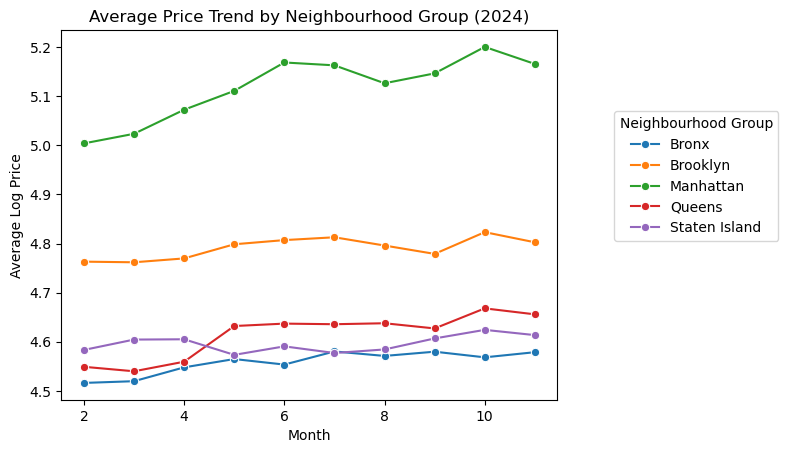

In [74]:
df_2024_trend = df_24.groupby(["month", "neighbourhood_group"])["log_price"].mean().reset_index()

# line chart, each line for each group
sns.lineplot(data=df_2024_trend, x="month", y="log_price", hue="neighbourhood_group", marker="o")
plt.xlabel("Month")
plt.ylabel("Average Log Price")
plt.title("Average Price Trend by Neighbourhood Group (2024)")
plt.legend(title="Neighbourhood Group",bbox_to_anchor=(1.1, 0.8))
plt.show()

#### Can you retrain your model using 202402 to 202410 data and predict 202411 price?

In [76]:
df_train = df_reg[(df_reg['year'] == 2024) & (df_reg['month'] >=2) & (df_reg['month'] <=10)]
X_train, y_train = df_train.drop(columns=['log_price']), df_train['log_price']
model.fit(X_train, y_train)

df_nov = df_reg[(df_reg["year"] == 2024) & (df_reg["month"] == 11)]

X_test = df_nov.drop(columns=['log_price'])
y_test = df_nov['log_price'] 

y_pred = model.predict(X_test)
print(f'R²: {r2_score(y_test, y_pred)}')
print(f'MSE: {mean_squared_error(y_test, y_pred)}')

R²: 0.9132597044873059
MSE: 0.03881228875616161


This model performs very well.

## Section 04: 2019 + 2024 Data Analysis

In [79]:
# Get the 2019 year data for analysis
df_19 = df[df["year"] == 2019]

#### Can you plot avg price trend by neibourhood_group for 2019?

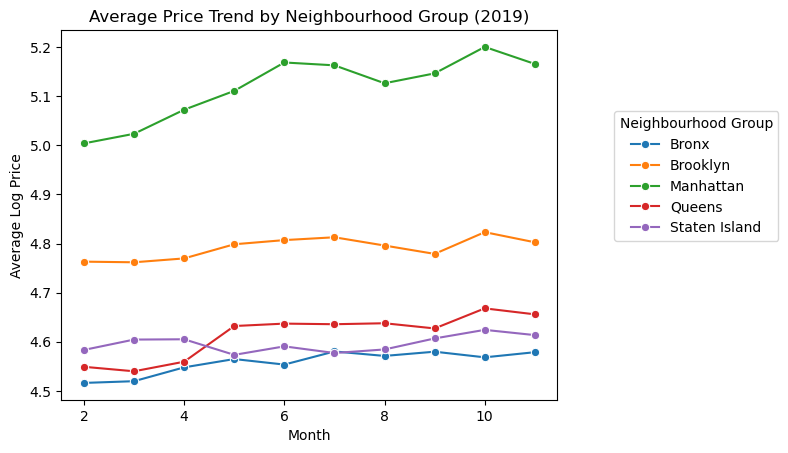

In [81]:
df_2019_trend = df_19.groupby(["month", "neighbourhood_group"])["log_price"].mean().reset_index()

# line chart, each line for each group
sns.lineplot(data=df_2024_trend, x="month", y="log_price", hue="neighbourhood_group", marker="o")
plt.xlabel("Month")
plt.ylabel("Average Log Price")
plt.title("Average Price Trend by Neighbourhood Group (2019)")
plt.legend(title="Neighbourhood Group",bbox_to_anchor=(1.1, 0.8))
plt.show()

#### Can you compare room type percentage between 2019 and 2024?

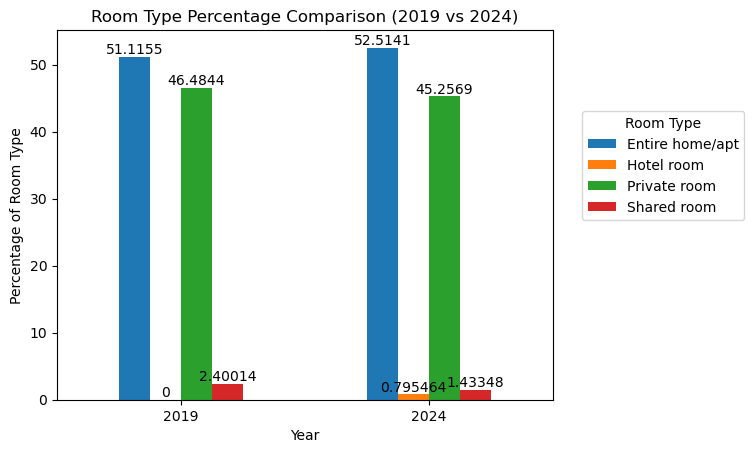

In [83]:
# calculate room type percentage
room_type_2019 = df_19["room_type"].value_counts(normalize=True) * 100
room_type_2024 = df_24["room_type"].value_counts(normalize=True) * 100

# merge the percentage data of 2019 and 2024
room_type_compare = pd.DataFrame({"2019": room_type_2019, "2024": room_type_2024}).T

# barplot
ax = room_type_compare.plot(kind="bar")
for container in ax.containers:
    ax.bar_label(container)  # label
plt.xlabel("Year")
plt.ylabel("Percentage of Room Type")
plt.title("Room Type Percentage Comparison (2019 vs 2024)")
plt.legend(title="Room Type",bbox_to_anchor=(1.4, 0.8))
plt.xticks(rotation=0)
plt.show()

Entire home/apt percentage is little higher in 2024, while private room & shared room is little lower in 2024. Especially, hotel room type appeared in 2024.

#### Can you compare price between 2019 and 2024? Do we notice any major change between 2019 and 2024?

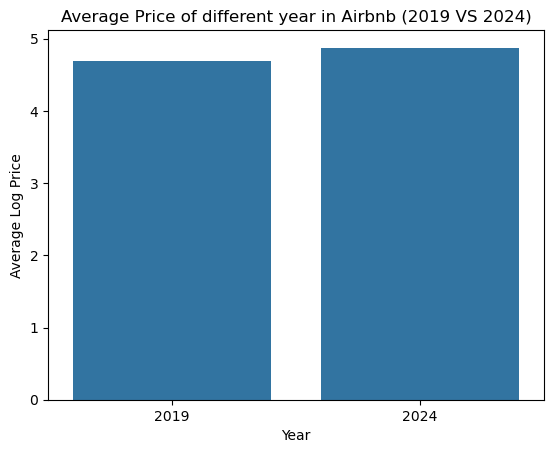

In [86]:
# calculate average year price
avg_price_by_year = df.groupby("year")["log_price"].mean().sort_values()

# barplot
sns.barplot(x=avg_price_by_year.index, y=avg_price_by_year.values)
plt.xlabel("Year")
plt.ylabel("Average Log Price")
plt.title("Average Price of different year in Airbnb (2019 VS 2024)")
plt.show()

In [87]:
from scipy.stats import ttest_ind # t-test

# average price in two years
avg_price_2019 = df_19["log_price"].mean()
avg_price_2024 = df_24["log_price"].mean()

# T test
t_stat, p_value = ttest_ind(df_19["log_price"], df_24["log_price"])
print(f"T-Test: t={t_stat:.2f}, p-value={p_value:.4f}")

if p_value < 0.05:
    print("There is significant price difference between 2019 and 2024.")
else:
    print("There is insignificant price difference between 2019 and 2024.")

T-Test: t=-53.13, p-value=0.0000
There is significant price difference between 2019 and 2024.


2024 price is significantly higher than 2019.